# Structure from Motionの実装

### SfMの手順 
  1. カメラキャリブレーション
  2. 特徴点の抽出とマッチング
  3. 基本行列/基礎行列の算出
      - 内部パラメータ**K**を用いて基本行列を算出
  4. 基本行列を特異値分解
  5. 最適な外部パラメータ(**R**, **t**)を決定
  6. 三角測量によって対応する点の三次元座標を算出
  7. バンドル調整

In [2]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
import glob

#### 1. カメラキャリブレーション
- カメラ行列と歪み係数の算出

In [3]:
square_size = 20      # キャリブレーションボードの正方形のサイズ
pattern_size = (7, 7) # 正方形の交差点の数

reference_img = 50 # キャリブレーション用の画像の数

pattern_points = np.zeros( (np.prod(pattern_size), 3), np.float32 ) 
pattern_points[:,:2] = np.indices(pattern_size).T.reshape(-1, 2)
pattern_points *= square_size
objpoints = []
imgpoints = []

images = glob.glob('reshaped/*.jpg')

for fname in images:
    img = cv2.imread(fname)
    height = img.shape[0]
    width = img.shape[1]

    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    ret, corner = cv2.findChessboardCorners(gray, pattern_size) # コーナー検出
 
    if ret == True:
        print("detected coner!")
        
        # Draw and display the corners
        #img = cv2.drawChessboardCorners(img, (7,7), corners2,ret)
        #cv2.imshow('img',img)
        #cv2.waitKey(0)
        #cv2.destroyAllWindows()
        #cv2.waitKey(1)
        
        print(str(len(objpoints)+1) + "/" + str(reference_img))
        term = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_COUNT, 30, 0.1)
        cv2.cornerSubPix(gray, corner, (5,5), (-1,-1), term)
        imgpoints.append(corner.reshape(-1, 2))   
        objpoints.append(pattern_points)

print("calculating camera parameter...")
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)

np.save("mtx", mtx) # カメラ行列
np.save("dist", dist.ravel()) # distortion

print("RMS = ", ret) #　再投影誤差
print("mtx = \n", mtx) # カメラ行列
print("dist = ", dist.ravel()) #歪み係数


detected coner!
1/50
detected coner!
2/50
detected coner!
3/50
detected coner!
4/50
detected coner!
5/50
detected coner!
6/50
detected coner!
7/50
detected coner!
8/50
detected coner!
9/50
detected coner!
10/50
detected coner!
11/50
detected coner!
12/50
detected coner!
13/50
detected coner!
14/50
detected coner!
15/50
detected coner!
16/50
detected coner!
17/50
detected coner!
18/50
detected coner!
19/50
detected coner!
20/50
detected coner!
21/50
detected coner!
22/50
detected coner!
23/50
detected coner!
24/50
detected coner!
25/50
detected coner!
26/50
detected coner!
27/50
detected coner!
28/50
detected coner!
29/50
detected coner!
30/50
detected coner!
31/50
detected coner!
32/50
detected coner!
33/50
detected coner!
34/50
detected coner!
35/50
detected coner!
36/50
detected coner!
37/50
detected coner!
38/50
detected coner!
39/50
detected coner!
40/50
detected coner!
41/50
detected coner!
42/50
detected coner!
43/50
detected coner!
44/50
detected coner!
45/50
detected coner!
46/

- 画像の歪み補正

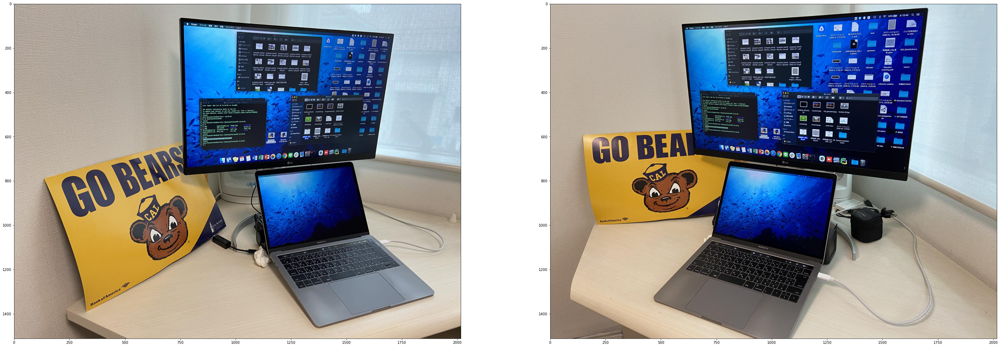

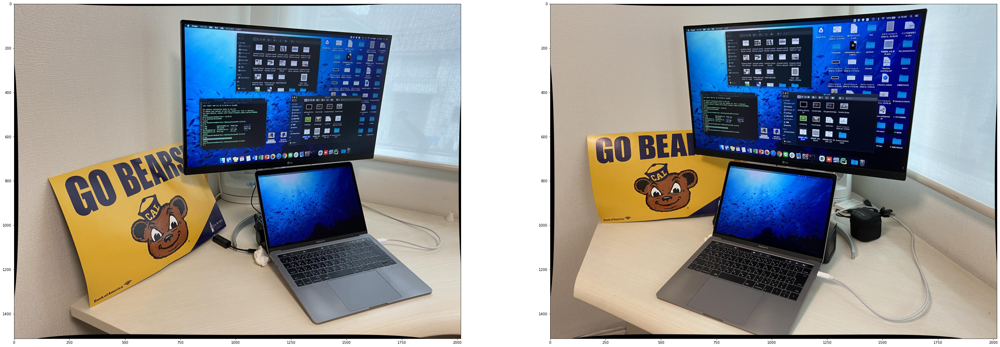

In [4]:
img1 = cv2.imread('desk/left_re.jpg')  #queryimage # left image
img2 = cv2.imread('desk/right_re.jpg') #trainimage # right image

# load camera matrix and distort matrix
K = mtx
dist_coef = dist

fig = plt.figure(figsize=(50, 100))
fig.add_subplot(1,2,1)
plt.imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))
fig.add_subplot(1,2,2)
plt.imshow(cv2.cvtColor(img2, cv2.COLOR_BGR2RGB))

img1 = cv2.undistort(img1, mtx, dist, None)
cv2.imwrite('desk/left_dist.jpg', img1)
img2 = cv2.undistort(img2, mtx, dist, None)
cv2.imwrite('desk/right_dist.jpg', img2)

fig = plt.figure(figsize=(50, 100))
fig.add_subplot(1,2,1)
plt.imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))
fig.add_subplot(1,2,2)
plt.imshow(cv2.cvtColor(img2, cv2.COLOR_BGR2RGB))

### 2. 特徴点の抽出とマッチング

### SIFTアルゴリズム + BFMatcher

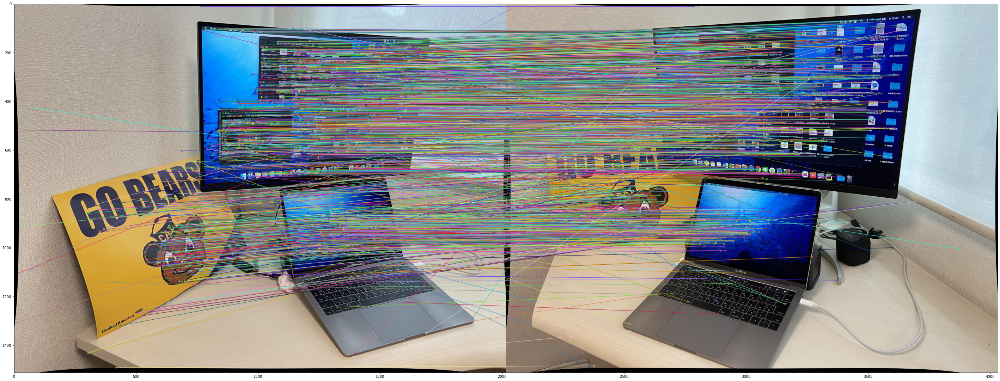

In [5]:
sift = cv2.xfeatures2d.SIFT_create()
kp1, des1 = sift.detectAndCompute(img1,None)
kp2, des2 = sift.detectAndCompute(img2,None)

# BFMatcher with default params
bf = cv2.BFMatcher()
matches = bf.knnMatch(des1,des2, k=2)

# Apply ratio test
good = []
for m,n in matches:
    if m.distance < 0.75*n.distance:
        good.append([m])

img3 = None
img3 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,good,img3,flags=2)
plt.figure(figsize=(50, 100))
plt.imshow(cv2.cvtColor(img3, cv2.COLOR_BGR2RGB))

### 3-1 基礎行列の算出

Fundamental Matrix : 
[[ 4.25710360e-08  1.75344920e-06 -7.49714280e-04]
 [ 1.35104543e-06 -2.83344439e-08 -7.01936652e-03]
 [-4.14917752e-04  3.84478283e-03  1.00000000e+00]]


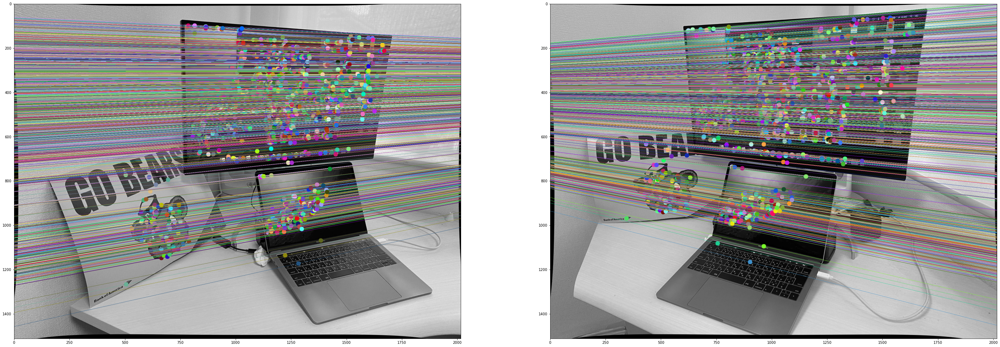

In [6]:
def drawlines(img1,img2,lines,pts1,pts2):
    r,c = img1.shape
    img1 = cv2.cvtColor(img1,cv2.COLOR_GRAY2BGR)
    img2 = cv2.cvtColor(img2,cv2.COLOR_GRAY2BGR)
    for r,pt1,pt2 in zip(lines,pts1,pts2):
        color = tuple(np.random.randint(0,255,3).tolist())
        x0,y0 = map(int, [0, -r[2]/r[1] ])
        x1,y1 = map(int, [c, -(r[2]+r[0]*c)/r[1] ])
        img1 = cv2.line(img1, (x0,y0), (x1,y1), color,1)
        pt1 = pt1.astype(np.int32)
        pt2 = pt2.astype(np.int32)
        img1 = cv2.circle(img1,tuple(pt1),10,color,-1)
        img2 = cv2.circle(img2,tuple(pt2),10,color,-1)
    return img1,img2

img1 = cv2.imread('desk/left_dist.jpg',0)  # 補正した画像（left)
img2 = cv2.imread('desk/right_dist.jpg',0) # 補正した画像（right)

sift = cv2.xfeatures2d.SIFT_create()
kp1, des1 = sift.detectAndCompute(img1,None)
kp2, des2 = sift.detectAndCompute(img2,None)

# BFMatcher
bf = cv2.BFMatcher()
matches = bf.knnMatch(des1,des2, k=2)

good = []
pts1 = []
pts2 = []

for m,n in matches:
    if m.distance < 0.75*n.distance:
        good.append([m])
        pts2.append(kp2[m.trainIdx].pt)
        pts1.append(kp1[m.queryIdx].pt)   

pts1 = np.float32(pts1)
pts2 = np.float32(pts2)
F, mask = cv2.findFundamentalMat(pts1,pts2,cv2.FM_LMEDS)
print("Fundamental Matrix : ")
print(F)

# 外れ値の除去
pts1 = pts1[mask.ravel()==1]
pts2 = pts2[mask.ravel()==1]

# left_distに対応する特徴点のエピポーラ線を描画
lines1 = cv2.computeCorrespondEpilines(pts2.reshape(-1,1,2), 2,F)
lines1 = lines1.reshape(-1,3)
img3,img4 = drawlines(img1,img2,lines1,pts1,pts2)

# right_distに対応する特徴点のエピポーラ線を描画
lines2 = cv2.computeCorrespondEpilines(pts1.reshape(-1,1,2), 1,F)
lines2 = lines2.reshape(-1,3)
img5,img6 = drawlines(img2,img1,lines2,pts2,pts1)

# 結果の表示
plt.figure(figsize=(50, 100))
plt.subplot(121),plt.imshow(img3)
plt.subplot(122),plt.imshow(img5)
plt.show()

Essential Matrix: 
[[ 0.09705335  4.00022914  0.97419807]
 [ 3.08220581 -0.06468473 -8.61478966]
 [ 1.01097777  8.40298604 -0.20416775]]

Rotation: 
[[ 0.68559775 -0.19017347  0.70270177]
 [ 0.20523952  0.97661314  0.06405869]
 [-0.69845005  0.10030369  0.70859488]]

translation: 
[[-0.89760199]
 [-0.11161132]
 [ 0.42644294]]


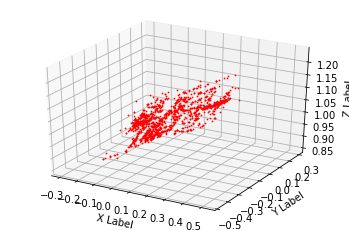

In [7]:
pts1_norm = cv2.undistortPoints(np.expand_dims(pts1, axis=1), cameraMatrix=K, distCoeffs=None)
pts2_norm = cv2.undistortPoints(np.expand_dims(pts2, axis=1), cameraMatrix=K, distCoeffs=None)

E = np.dot(np.dot(K.T, F), K)

points, R, t, mask = cv2.recoverPose(E, pts1_norm, pts2_norm)
print("Essential Matrix: ")
print(E)
print("\nRotation: ") 
print(R)
print("\ntranslation: ") 
print(t)

M_r = np.hstack((R, t))
M_l = np.hstack((np.eye(3, 3), np.zeros((3, 1))))

P_l = np.dot(K,  M_l)
P_r = np.dot(K,  M_r)
point_4d_hom = cv2.triangulatePoints(P_l, P_r, np.expand_dims(pts1, axis=1), np.expand_dims(pts2, axis=1))
point_4d = point_4d_hom / np.tile(point_4d_hom[-1, :], (4, 1))
point_4d = point_4d[:3, :].T



from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

num = len(point_4d)
for var in range(0,num-1):
    xs = point_4d[var,0]
    ys = point_4d[var,1]
    zs = point_4d[var,2]
    ax.scatter(xs, ys, zs, c='r', marker='o', s = 0.5)

ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')
ax.set_zlabel('Z Label')

plt.show()

In [33]:
# SVD (see scipy.org)
U, tmp_s, v_ctrans = np.linalg.svd(E)
# matrix V
V = np.conjugate(np.transpose(v_ctrans))

R = np.dot(np.dot(U, W), V.T)
print(R)

[[ 0.68559775 -0.19017347  0.70270177]
 [ 0.20523952  0.97661314  0.06405869]
 [-0.69845005  0.10030369  0.70859488]]
